In [24]:
import json
from collections import defaultdict
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import copy
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
from functools import reduce
import random
from tqdm import tqdm

In [25]:
merimen_crack_data = json.load(open('/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/annotations/total.json'))
print('len of crack images: ', len(merimen_crack_data['images']))
print('len of crack annos: ', len(merimen_crack_data['annotations']))
car_data = json.load(open('/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/annotations/total_car.json'))
print('len of car images: ', len(car_data['images']))
print('len of car annos: ', len(car_data['annotations']))

imgToCrackAnns = defaultdict(list)
for ann in merimen_crack_data['annotations']:
    imgToCrackAnns[ann['image_id']].append(ann)
imgToCarAnns = defaultdict(list)
for ann in car_data['annotations']:
    imgToCarAnns[ann['image_id']].append(ann)


len of crack images:  98603
len of crack annos:  160079
len of car images:  98603
len of car annos:  361573


In [4]:
print(len(imgToCrackAnns.keys()))
print(len(imgToCarAnns.keys()))
print(merimen_crack_data['categories'])

98603
94253
[{'supercategory': 'Carparts', 'id': 0, 'name': 'crack'}, {'supercategory': 'Carparts', 'id': 1, 'name': 'broken'}, {'supercategory': 'Carparts', 'id': 2, 'name': 'glass_broken'}, {'supercategory': 'Carparts', 'id': 3, 'name': 'lamp_broken'}, {'supercategory': 'Carparts', 'id': 4, 'name': 'hole'}]


In [26]:
damage_names = [cat['name'] for cat in merimen_crack_data['categories']]
print(damage_names)
def create_img_to_damage_mapping():
    mapping_list = []
    for cls in damage_names:
        mapping_name = 'imgTo' + str(cls)
        locals()[mapping_name] = defaultdict(list)
        for ann in merimen_crack_data['annotations']:
            if damage_names[ann['category_id']] == str(cls):
                locals()[mapping_name][ann['image_id']].append(ann)
        mapping_list.append(locals()[mapping_name])
    return mapping_list
damage_mapping_list = create_img_to_damage_mapping()
print('number of types of damages', len(damage_mapping_list))

def compute_area(seg):
    seg = np.array(seg).reshape(-1,2).astype(np.int32)
    area = cv2.contourArea(seg)
    if area == 0:
        area = 1e-5
    return area
def compute_iou(carpart_mask, damage_mask):
    area1 = np.sum(carpart_mask)
    area2 = np.sum(damage_mask)
    overlap = np.sum(np.logical_and(carpart_mask, damage_mask))
    iou = overlap/(area1+area2-overlap)
    return iou
def draw_binary_mask(seg, img_shape):
    seg = np.array(seg).reshape(-1,2).astype(np.int32)
    mask = np.zeros(img_shape)
    mask = cv2.fillPoly(mask, [seg],1)
    return mask
def draw_masks(num, anno_type):
#     random.seed(3)
    img_ids = random.sample(list(anno_type.keys()), num**2) 
    fig, axs = plt.subplots(num, num, figsize=(15,15))
    
    for i, img_id in enumerate(img_ids):    
        anns = anno_type[img_id]
        
        for img in merimen_crack_data['images']:
            if img['id'] == img_id:
                img_name = img['file_name']
                img_url = img['url']
                img_area = img['height']*img['width']
                break
        img_path = os.path.join('/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/images/', img_name)
        I = cv2.imread(img_path)
        I = cv2.cvtColor(I, cv2.COLOR_BGR2RGB)
#plot contours          
        cnts = [np.array(ann['segmentation']).reshape(-1,2).astype(int) for ann in anns]

        I = cv2.drawContours(I,cnts,-1,(0,255,0),4)
        
        axs[int(i/num),i%num].imshow(I)
        axs[int(i/num),i%num].set_title(img_id)
        

['crack', 'broken', 'glass_broken', 'lamp_broken', 'hole']
number of types of damages 5


## visualize

In [27]:
crack_idx = damage_names.index('crack')
broken_idx = damage_names.index('broken')
glass_broken_idx = damage_names.index('glass_broken')
lamp_broken_idx = damage_names.index('lamp_broken')
hole_idx = damage_names.index('hole')

total_crack = damage_mapping_list[crack_idx]
total_broken = damage_mapping_list[broken_idx]
total_glass_broken = damage_mapping_list[glass_broken_idx]
total_lamp_broken = damage_mapping_list[lamp_broken_idx]
total_hole = damage_mapping_list[hole_idx]

### crack

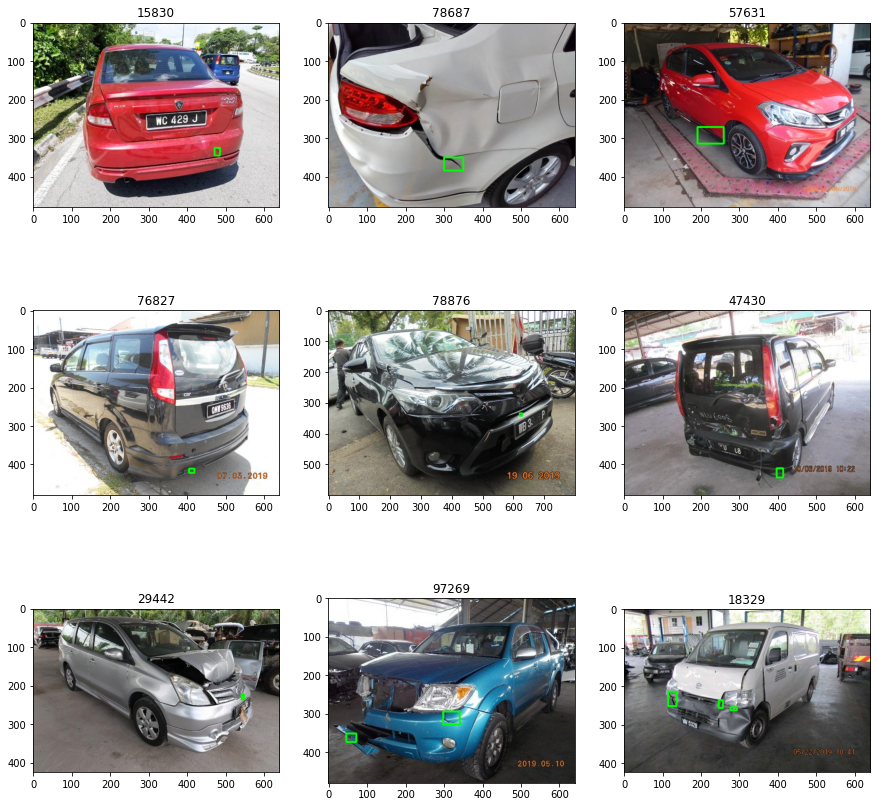

In [36]:
draw_masks(3, total_crack)
#clean with similar damage/image_area ratio threshold to scratch??

### broken

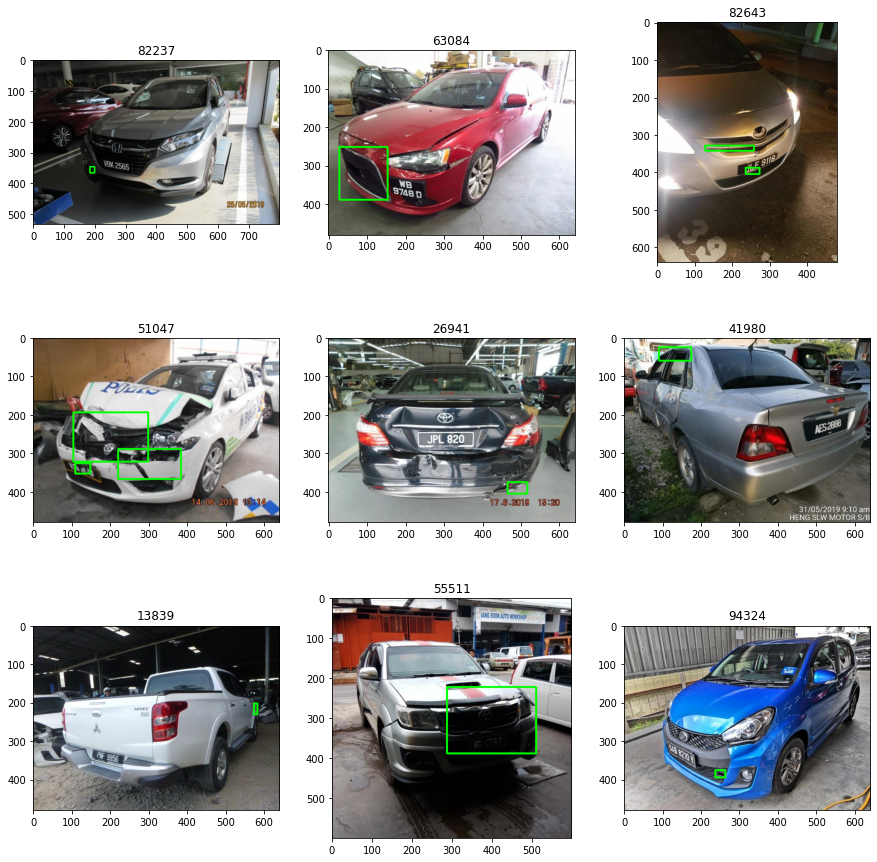

In [44]:
draw_masks(3, total_broken)

### glass_broken

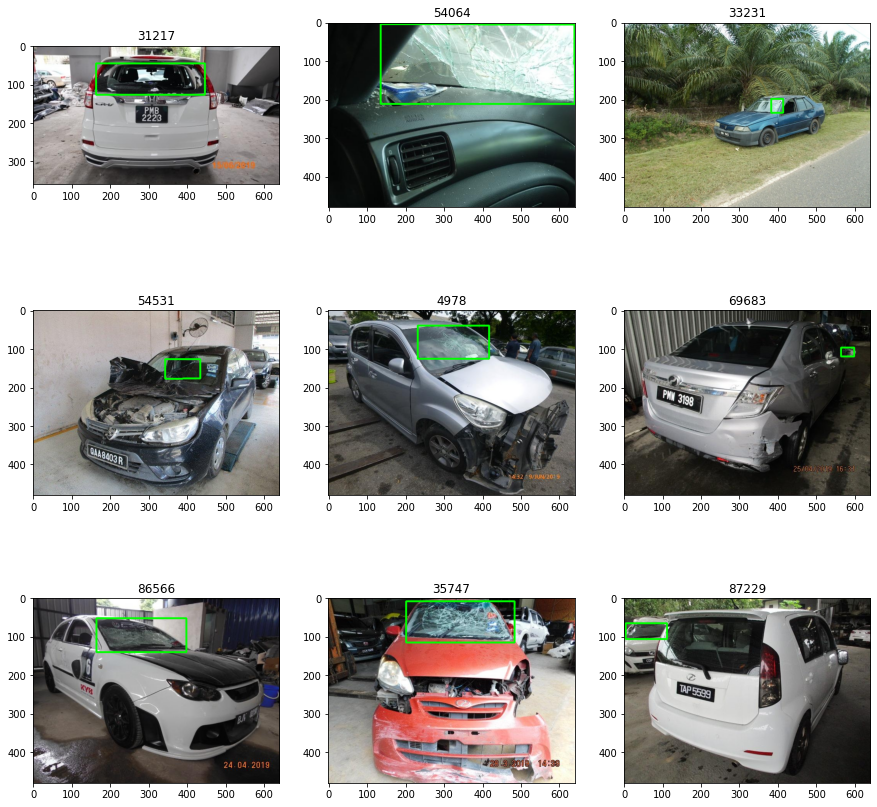

In [32]:
draw_masks(3, total_glass_broken)

### lamp_broken

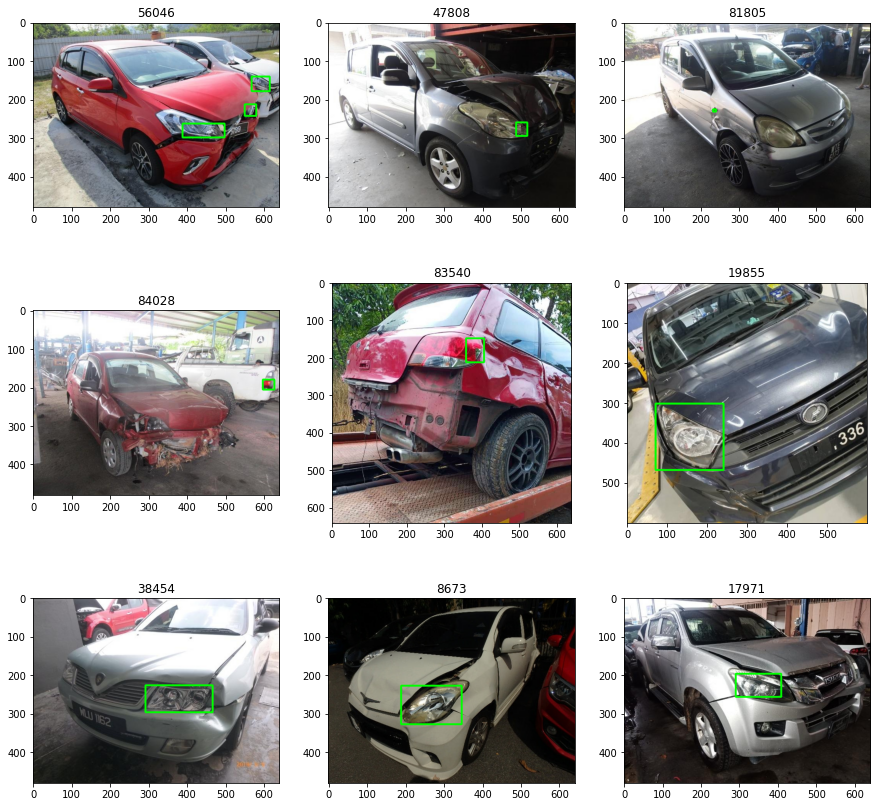

In [46]:
draw_masks(3, total_lamp_broken)

### hole

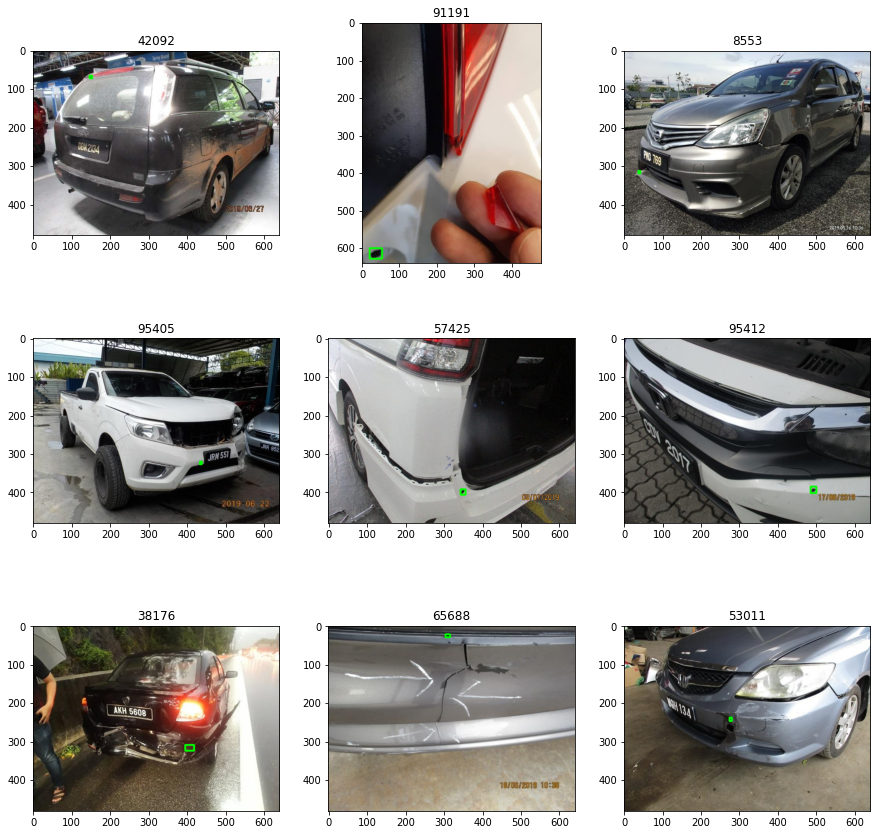

In [47]:
draw_masks(3, total_hole)

## clean outliers

### crack

In [30]:
crack_ratio_dist = []
large_crack = defaultdict(list)
tiny_crack = defaultdict(list)
for img_id, crack_anns in total_crack.items():
    for img in merimen_crack_data['images']:
        if img['id'] == img_id:
            img_name = img['file_name']
            img_area = img['height']*img['width']
            break
    I = cv2.imread(os.path.join('/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/images/', img_name))    
    for crack_ann in crack_anns:
        crack_area = crack_ann['bbox'][2] * crack_ann['bbox'][3] if crack_ann['bbox'][2] * crack_ann['bbox'][3] > 0 else 1e-5
        crack_img_ratio = crack_area/img_area
        crack_ratio_dist.append(crack_img_ratio)
        if (crack_img_ratio > 0.2):
            large_crack[img_id].append(crack_ann)
        elif crack_img_ratio < np.exp(-8.5):
            tiny_crack[img_id].append(crack_ann)
            
    

In [89]:
print(len(tiny_crack.keys()))

3467


In [90]:
print(len(large_crack.keys()))

149


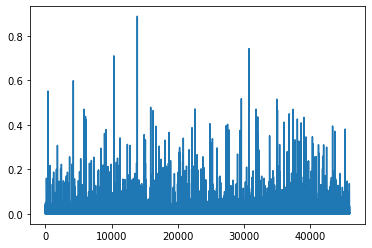

In [49]:
plt.plot(crack_ratio_dist)

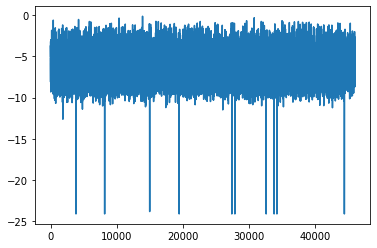

In [50]:
plt.plot(np.log(crack_ratio_dist))

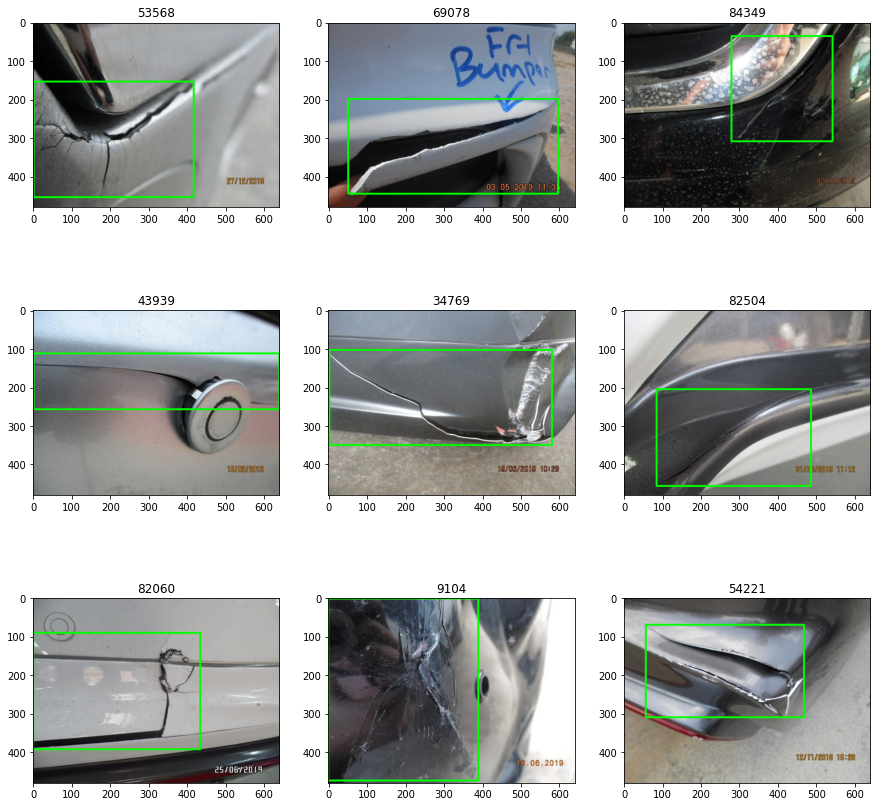

In [105]:
draw_masks(3, large_crack)

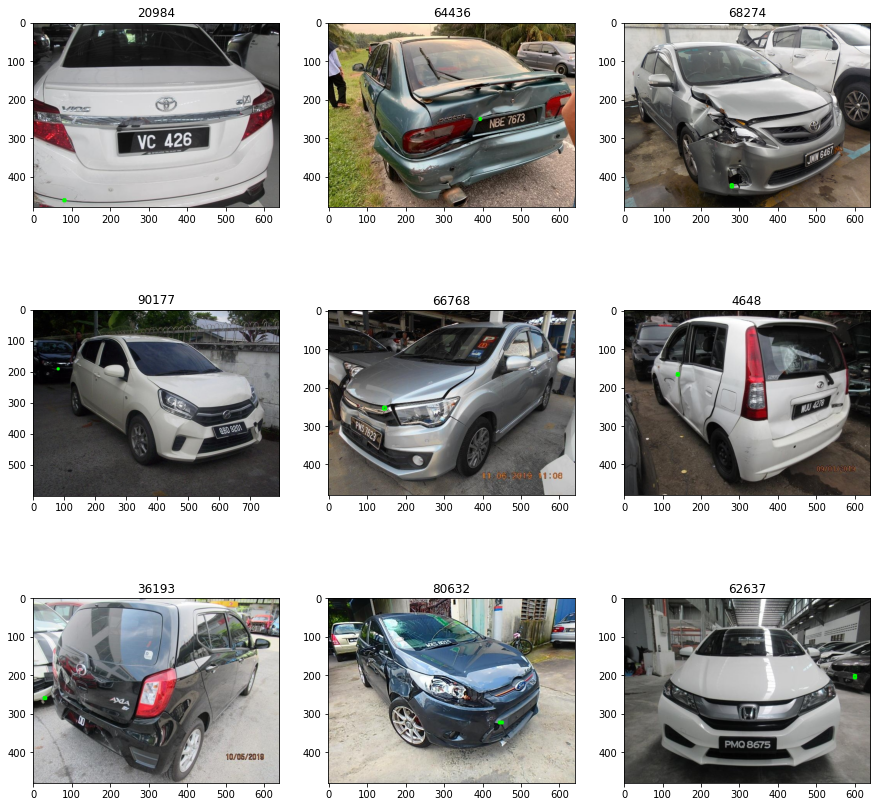

In [106]:
draw_masks(3, tiny_crack)

In [59]:
len([i for i in crack_ratio_dist if i < np.exp(-8.5)])

3731

In [86]:
len([i for i in crack_ratio_dist if i > 0.2])

149

In [56]:
len(reduce(lambda x,y: x+y, list(total_crack.values())))

45971

### broken

In [31]:
broken_ratio_dist = []
large_broken = defaultdict(list)
tiny_broken = defaultdict(list)
for img_id, broken_anns in total_broken.items():
    for img in merimen_crack_data['images']:
        if img['id'] == img_id:
            img_name = img['file_name']
            img_area = img['height']*img['width']
            break
    I = cv2.imread(os.path.join('/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/images/', img_name))    
    for broken_ann in broken_anns:
        broken_area = broken_ann['bbox'][2] * broken_ann['bbox'][3] if broken_ann['bbox'][2] * broken_ann['bbox'][3] > 0 else 1e-5
        broken_img_ratio = broken_area/img_area
        broken_ratio_dist.append(broken_img_ratio)
        if (broken_img_ratio > 0.1):
            large_broken[img_id].append(broken_ann)
        elif broken_img_ratio < np.exp(-8.5):
            tiny_broken[img_id].append(broken_ann)
            
    

In [117]:
print(len(large_broken.keys()))
print(len(tiny_broken.keys()))

2052
899


(array([3.5381e+04, 8.4800e+03, 3.6850e+03, 2.1440e+03, 1.3950e+03,
        1.0170e+03, 7.4300e+02, 5.2800e+02, 4.7200e+02, 3.4200e+02,
        2.9100e+02, 2.3600e+02, 1.9200e+02, 1.5200e+02, 1.4100e+02,
        1.1400e+02, 9.7000e+01, 6.7000e+01, 6.4000e+01, 6.4000e+01,
        5.8000e+01, 5.6000e+01, 5.5000e+01, 3.7000e+01, 3.2000e+01,
        3.6000e+01, 2.9000e+01, 2.8000e+01, 2.9000e+01, 1.0000e+01,
        1.7000e+01, 1.6000e+01, 2.0000e+01, 1.7000e+01, 1.2000e+01,
        1.7000e+01, 1.8000e+01, 9.0000e+00, 1.5000e+01, 9.0000e+00,
        7.0000e+00, 8.0000e+00, 8.0000e+00, 9.0000e+00, 1.1000e+01,
        8.0000e+00, 9.0000e+00, 7.0000e+00, 7.0000e+00, 6.0000e+00,
        6.0000e+00, 6.0000e+00, 5.0000e+00, 7.0000e+00, 3.0000e+00,
        1.0000e+00, 4.0000e+00, 7.0000e+00, 1.0000e+00, 7.0000e+00,
        4.0000e+00, 4.0000e+00, 2.0000e+00, 5.0000e+00, 0.0000e+00,
        4.0000e+00, 4.0000e+00, 2.0000e+00, 0.0000e+00, 1.0000e+00,
        0.0000e+00, 2.0000e+00, 1.0000e+00, 2.00

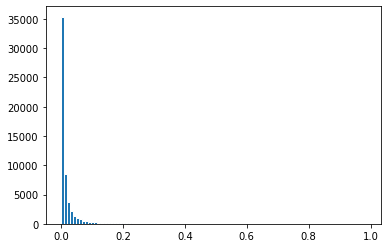

In [111]:
plt.hist(broken_ratio_dist, bins=100,edgecolor='w')

(array([1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 4.000e+00, 1.000e+01, 2.000e+01, 4.600e+01,
        6.800e+01, 1.010e+02, 1.560e+02, 2.200e+02, 3.600e+02, 5.290e+02,
        6.720e+02, 8.830e+02, 1.149e+03, 1.344e+03, 1.624e+03, 2.004e+03,
        2.141e+03, 2.486e+03, 2.629e+03, 2.848e+03, 2.985e+03, 3.207e+03,
        3.393e+03, 3.440e+03, 3.350e+0

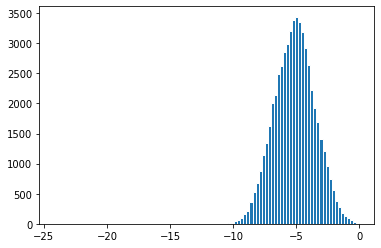

In [108]:
plt.hist(np.log(broken_ratio_dist), bins=100,edgecolor='w')

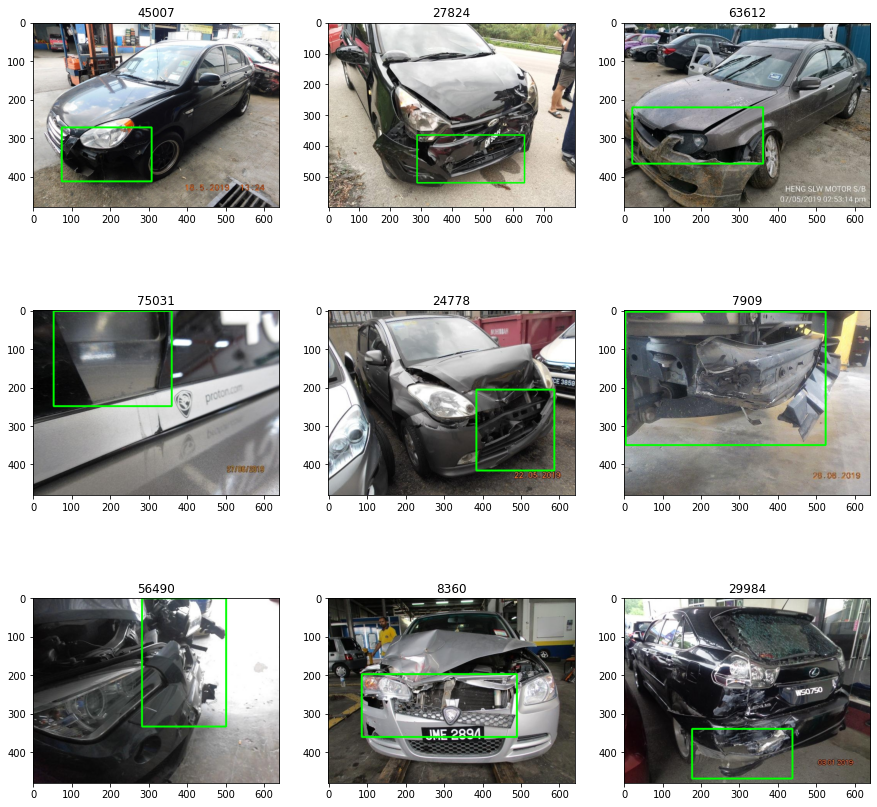

In [116]:
draw_masks(3, large_broken)

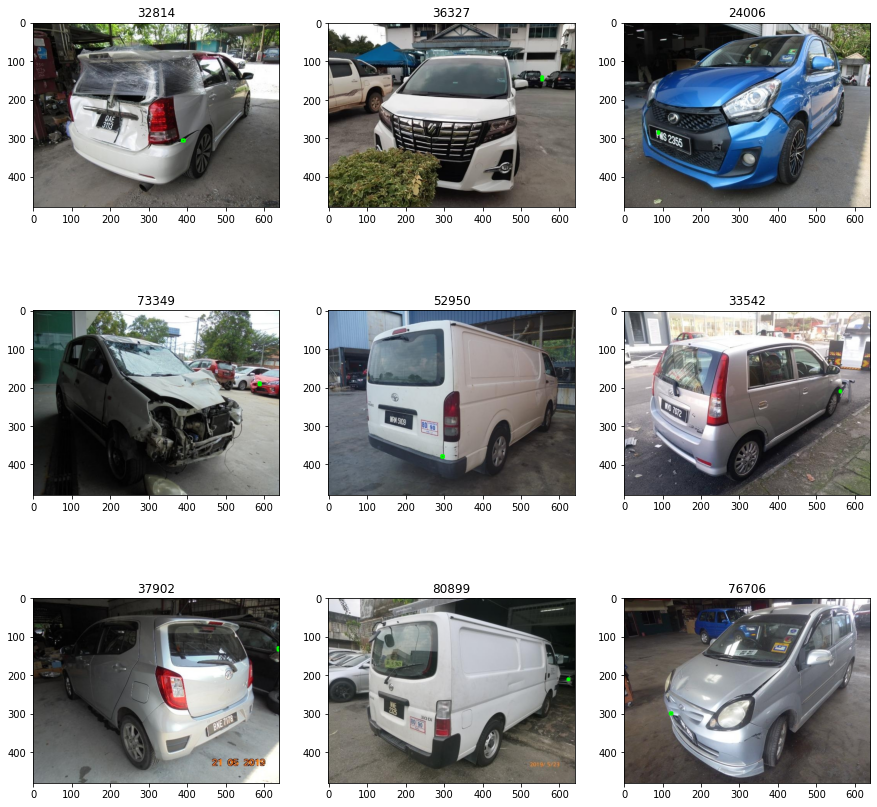

In [115]:
draw_masks(3, tiny_broken)

### lamp_broken

In [28]:
carpart_config = '/mmdetection/checkpoints/carpart_phase_2/carpart_pseudo.py'
carpart_checkpoint = '/mmdetection/checkpoints/carpart_phase_2/epoch_24.pth'
carpart_model = init_detector(carpart_config, carpart_checkpoint, device='cuda:1')
carpart_labels = carpart_model.CLASSES
def load_predicted_result(model, img, conf_score=0.5):
    result = inference_detector(model, img.copy())
    out_image,pd_boxes,pd_segs,pd_labels,pd_scores = show_result_pyplot(model,img.copy(),result,score_thr=conf_score)
    return pd_segs,pd_labels,pd_scores,out_image
light_labels = ['sli_side_turn_light','hli_head_light','tli_tail_light','fli_fog_light','lli_low_bumper_tail_light']

load checkpoint from local path: /mmdetection/checkpoints/carpart_phase_2/epoch_24.pth


/mmdetection/mmdet/datasets/utils.py:64: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(
/mmdetection/mmdet/core/anchor/anchor_generator.py:323: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/mmdetection/mmdet/core/anchor/anchor_generator.py:359: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  warnings.warn(


[ 0  1  1  2  2  3  4  5  6  7  7  7  8  9 10 11 11 12 12 13 14 17 19 19
 23 24] (26,)
['sli_side_turn_light', 'tyre', 'tyre', 'alloy_wheel', 'alloy_wheel', 'hli_head_light', 'hood', 'fwi_windshield', 'flp_front_license_plate', 'door', 'door', 'door', 'mirror', 'handle', 'qpa_quarter_panel', 'fender', 'fender', 'grille', 'grille', 'fbu_front_bumper', 'rocker_panel', 'roof', 'window', 'window', 'fbe_fog_light_bezel', 'fli_fog_light']


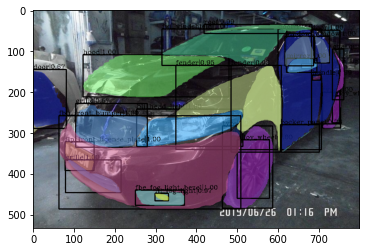

In [19]:
#plot carpart predited masks
img_id = list(total_lamp_broken.keys())[0]
for img in merimen_crack_data['images']:
    if img['id'] == img_id:
        img_name = img['file_name']
        img_url = img['url']
        img_area = img['height']*img['width']
        break
I = cv2.imread(os.path.join('/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/images/', img_name))    
I = cv2.cvtColor(I, cv2.COLOR_BGR2RGB)
pd_segs,pd_labels,pd_scores,out_image = load_predicted_result(carpart_model, I)
plt.imshow(out_image)
print(pd_labels,pd_labels.shape)
print([carpart_labels[idx] for idx in pd_labels])

# plot_img(img_id, imgToLamp_broken[img_id])

In [22]:
print(len(total_lamp_broken.keys()))

45240


In [29]:
iou_list=[]
large_lamp_broken = defaultdict(list)
tiny_lamp_broken = defaultdict(list)
# light_infer_masks = defaultdict(list)
for (idx, (img_id, broken_anns)) in tqdm(enumerate(total_lamp_broken.items())):
#     if idx >300:
#         break
    for img in merimen_crack_data['images']:
        if img['id'] == img_id:
            img_name = img['file_name']
            img_url = img['url']
            img_area = img['height']*img['width']
            break
    
    img_path = os.path.join('/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/images/', img_name)
    I = cv2.imread(img_path)
    img_shape = I.shape[:2]
    I = cv2.cvtColor(I, cv2.COLOR_BGR2RGB)
    broken_segs = [draw_binary_mask(ann['segmentation'], img_shape) for ann in broken_anns]

    pd_segs,pd_labels,pd_scores,out_image = load_predicted_result(carpart_model, I)
    light_segs = [pd_segs[idx] for idx,pd_label in enumerate(pd_labels) if (carpart_labels[pd_label] in light_labels)]
#     light_infer_masks[img_id] = light_segs
    if len(light_segs) == 0:
        continue
#     print(len(broken_segs), len(light_segs), img_id)
 
    for i, broken_seg in enumerate(broken_segs):
        for light_seg in light_segs:
            iou = compute_iou(light_seg, broken_seg)
            iou_list.append(iou)
            if iou>0.6:
                large_lamp_broken[img_id].append(broken_anns[i])
            if iou<0.1 and np.sum(broken_seg)/img_area < 0.2:
                tiny_lamp_broken[img_id].append(broken_anns[i])

45240it [1:52:19,  6.71it/s]


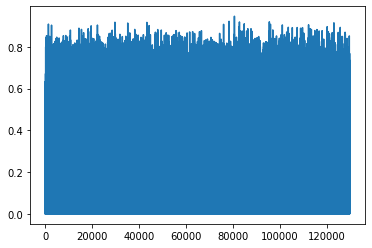

In [35]:
plt.plot(iou_list)

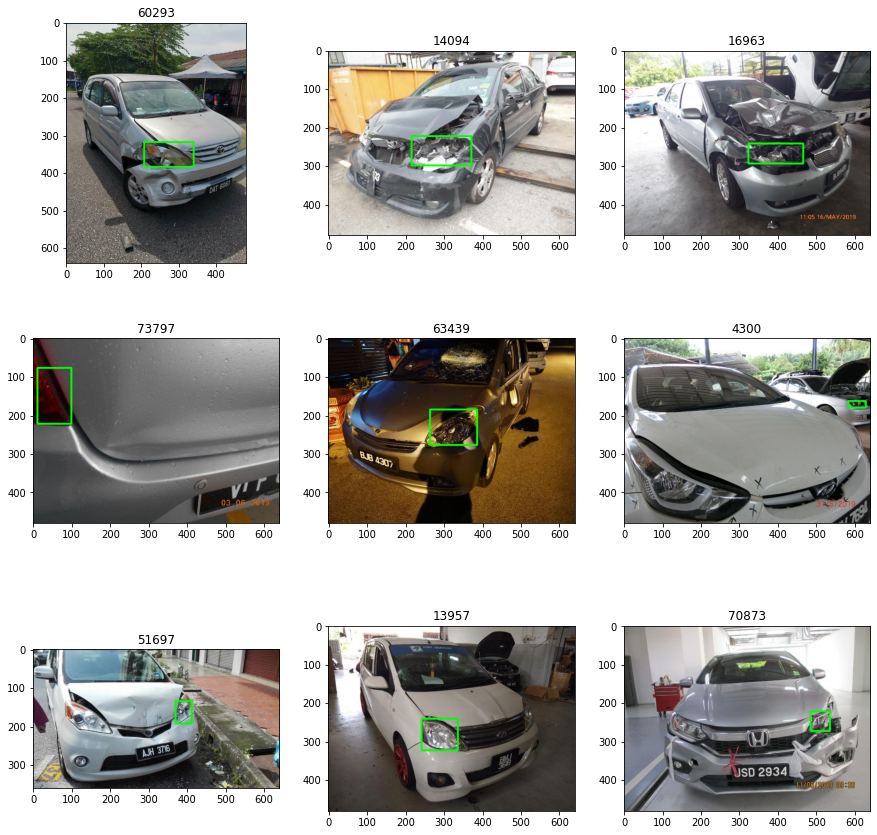

In [39]:
draw_masks(3, large_lamp_broken)

In [40]:
len(large_lamp_broken.keys())

11644

### hole

In [34]:
tiny_hole = defaultdict(list)
for img_id, hole_anns in total_hole.items():
    for img in merimen_crack_data['images']:
        if img['id'] == img_id:
            img_name = img['file_name']
            img_url = img['url']
            img_area = img['height']*img['width']
            break
    for hole_ann in hole_anns:
        if(compute_area(hole_ann['segmentation'])/img_area<10e-4):
            tiny_hole[img_id].append(hole_ann)
print('num of tiny hole anno:', len(tiny_hole.values()))   

num of tiny hole anno: 404


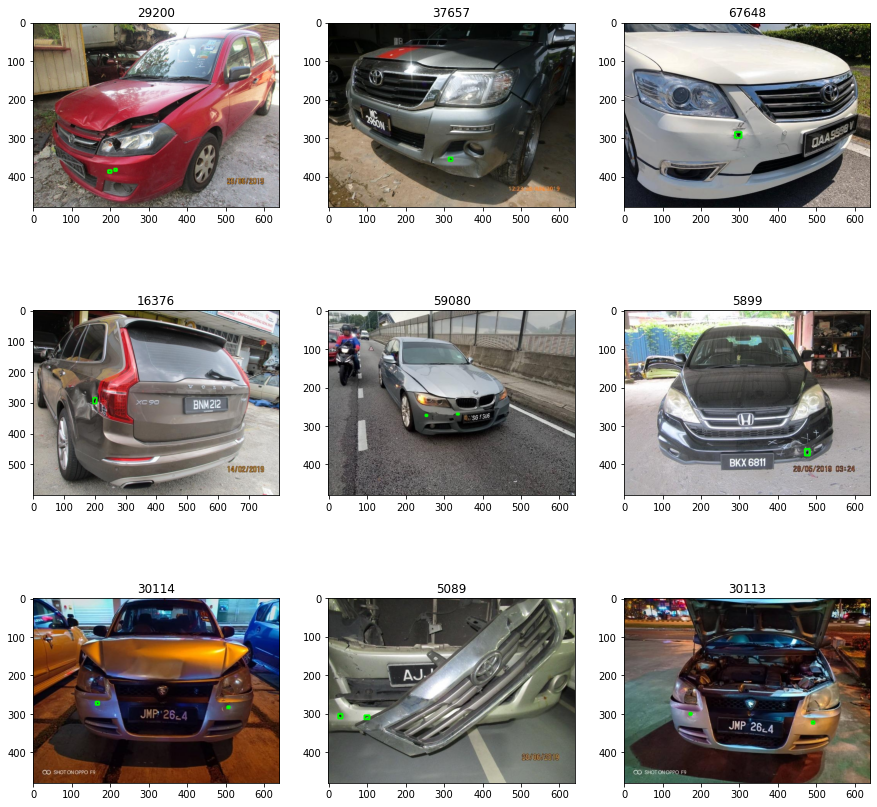

In [16]:
draw_masks(3, tiny_hole)

## create new crack merimen dataset

In [41]:
def double_check(data):
    img_ids = [img['id'] for img in data['images']]
    img_ids_in_annos = set([ann['image_id'] for ann in data['annotations']])
    differential_quant = len(img_ids) - len(img_ids_in_annos)
    if (differential_quant <= 0):
        print("check 'double_check' function again")
    else:
        print('have positive differential quantity')
        new_images = []
        for img in data['images']:
            if img['id'] in img_ids_in_annos:
                new_images.append(img)
        data['images'] = new_images
    return data

In [45]:
total_removed_anns_v1= list(tiny_hole.values()) + list(large_broken.values()) + list(large_lamp_broken.values()) + list(total_glass_broken.values()) + list(tiny_crack.values()) + list(large_crack.values())
total_removed_anns_v1 = reduce(lambda x,y: x+y, total_removed_anns_v1)
print(len(total_removed_anns_v1))

new_crack_data_v1 = copy.deepcopy(merimen_crack_data)
new_crack_data_v1['annotations'] = [ann for ann in new_crack_data_v1['annotations'] if ann not in total_removed_anns_v1]
new_crack_data_v1['categories'] = [{'supercategory': 'Carparts', 'id': 0, 'name': 'crack'}]
for ann in new_crack_data_v1['annotations']:
    ann['category_id'] = 0
double_check(new_crack_data_v1)
path_v1 = '/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/annotations/clean_crack_v1.json'

with open(path_v1, 'w', encoding='utf-8') as json_file:
    json.dump(new_crack_data_v1, json_file, ensure_ascii=False, indent=4)

25509
have positive differential quantity


In [43]:
print(len(merimen_crack_data['annotations']))
print(len(new_crack_data_v1['annotations']))
print(len(merimen_crack_data['annotations'])-len(new_crack_data_v1['annotations']))
print('-'*100)
print(len(new_crack_data_v1['images']))

160079
134903
25176
----------------------------------------------------------------------------------------------------
87281


In [46]:
total_removed_anns_v2= list(tiny_hole.values()) + list(large_lamp_broken.values()) + list(total_glass_broken.values()) + list(tiny_crack.values()) + list(large_crack.values())
total_removed_anns_v2 = reduce(lambda x,y: x+y, total_removed_anns_v2)
print(len(total_removed_anns_v2))

new_crack_data_v2 = copy.deepcopy(merimen_crack_data)
new_crack_data_v2['annotations'] = [ann for ann in new_crack_data_v2['annotations'] if ann not in total_removed_anns_v2]
new_crack_data_v2['categories'] = [{'supercategory': 'Carparts', 'id': 0, 'name': 'crack'}, {'supercategory': 'Carparts', 'id': 1, 'name': 'broken'}]

for ann in new_crack_data_v2['annotations']:
    if ann['category_id'] != 1:
        ann['category_id'] = 0
double_check(new_crack_data_v2)

path_v2 = '/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/annotations/clean_crack_v2.json'
    
with open(path_v2, 'w', encoding='utf-8') as json_file:
    json.dump(new_crack_data_v2, json_file, ensure_ascii=False, indent=4)

23448
have positive differential quantity


In [47]:
print(len(merimen_crack_data['annotations']))
print(len(new_crack_data_v2['annotations']))
print(len(merimen_crack_data['annotations'])-len(new_crack_data_v2['annotations']))
print('-'*100)
print(len(new_crack_data_v2['images']))

160079
136964
23115
----------------------------------------------------------------------------------------------------
88512


## split train/val/test dataset

In [ ]:
def anno_mapping(data, imgs_dest):
    img_ids = [img['id'] for img in imgs_dest]
    ann_dest = [ann for ann in data['annotations'] if ann['image_id'] in img_ids]
    return ann_dest
def data_splitter(data_list, ratio):
    data_len = len(data_list)
    anchor1 = int(ratio[0] * data_len)
    print(type(anchor1))
    anchor2 = int((ratio[0] + ratio[1]) * data_len)
    return data_list[:anchor1], data_list[anchor1: anchor2], data_list[anchor2:]

In [ ]:
imgs_train_v1, imgs_valid_v1, imgs_test_v1 = data_splitter(new_crack_data_v1['images'], [0.7,0.15,0.15])
anns_train_v1 = anno_mapping(new_crack_data_v1, imgs_train_v1)
anns_valid_v1 = anno_mapping(new_crack_data_v1, imgs_valid_v1)
anns_test_v1 = anno_mapping(new_crack_data_v1, imgs_test_v1)

train_data_v1 = copy.deepcopy(new_crack_data_v1)
train_data_v1['annotations'] = anns_train_v1
train_data_v1['images'] = imgs_train_v1

test_data_v1 = copy.deepcopy(new_crack_data_v1)
test_data_v1['annotations'] = anns_test_v1
test_data_v1['images'] = imgs_test_v1

valid_data_v1 = copy.deepcopy(new_crack_data_v1)
valid_data_v1['annotations'] = anns_valid_v1
valid_data_v1['images'] = imgs_valid_v1

with open('/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/annotations/train_v1.json', 'w', encoding='utf-8') as json_file:
    json.dump(train_data_v1, json_file, ensure_ascii= False, indent=4)
    
with open('/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/annotations/test_v1.json', 'w', encoding='utf-8') as json_file:
    json.dump(test_data_v1, json_file, ensure_ascii= False, indent=4)
    
with open('/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/annotations/valid_v1.json', 'w', encoding='utf-8') as json_file:
    json.dump(valid_data_v1, json_file, ensure_ascii= False, indent=4)

In [ ]:
imgs_train_v2, imgs_valid_v2, imgs_test_v2= data_splitter(new_crack_data_v2['images'], [0.7,0.15,0.15])
anns_train_v2 = anno_mapping(new_crack_data_v2, imgs_train_v2)
anns_valid_v2 = anno_mapping(new_crack_data_v2, imgs_valid_v2)
anns_test_v2 = anno_mapping(new_crack_data_v2, imgs_test_v2)

train_data_v2 = copy.deepcopy(new_crack_data_v2)
train_data_v2['annotations'] = anns_train_v2
train_data_v2['images'] = imgs_train_v2

test_data_v2 = copy.deepcopy(new_crack_data_v2)
test_data_v2['annotations'] = anns_test_v2
test_data_v2['images'] = imgs_test_v2

valid_data_v2 = copy.deepcopy(new_crack_data_v2)
valid_data_v2['annotations'] = anns_valid_v2
valid_data_v2['images'] = imgs_valid_v2

with open('/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/annotations/train_v2.json', 'w', encoding='utf-8') as json_file:
    json.dump(train_data_v2, json_file, ensure_ascii= False, indent=4)
    
with open('/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/annotations/test_v2.json', 'w', encoding='utf-8') as json_file:
    json.dump(test_data_v2, json_file, ensure_ascii= False, indent=4)
    
with open('/mmdetection/data/coco_datasets/datasets/merimen_coco/06_04_2022/annotations/valid_v2.json', 'w', encoding='utf-8') as json_file:
    json.dump(valid_data_v2, json_file, ensure_ascii= False, indent=4)